# Demo Notebook for Explainers

## Imports

In [1]:
import os
import sys

sys.path.append(os.path.abspath(os.path.join('..')))

In [2]:
import random
import copy
import torch
import lightning as L
import matplotlib.pyplot as plt
from tqdm import tqdm
from datasets import load_dataset
from torchvision.utils import make_grid
from torchvision.models import resnet18
from torchvision import transforms, models
from torch.utils.data import DataLoader, Dataset, Subset

from quanda.utils.training import BasicLightningModule
from quanda.metrics.downstream_eval import ClassDetectionMetric
from quanda.benchmarks.downstream_eval import SubclassDetection
from quanda.metrics.randomization import ModelRandomizationMetric
from quanda.metrics.downstream_eval import DatasetCleaningMetric, TopKOverlapMetric
from quanda.utils.functions import cosine_similarity, dot_product_similarity
from captum.influence._utils.nearest_neighbors import AnnoyNearestNeighbors
from quanda.explainers.wrappers import captum_tracincp_self_influence, CaptumArnoldi, CaptumSimilarity, CaptumTracInCPFastRandProj, CaptumTracInCP, captum_arnoldi_explain, captum_similarity_self_influence, captum_similarity_explain, captum_arnoldi_self_influence, captum_tracincp_explain, captum_tracincp_fast_rand_proj_explain


/home/nisc22/.conda/envs/new_env/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
DEVICE = "cuda:0" if torch.cuda.is_available() else "cpu"
torch.set_float32_matmul_precision("medium")
print("Running on device:", DEVICE.upper())

Running on device: CUDA:0


## Load dataset

In [4]:
class TinyImageNet(Dataset):
    def __init__(self, dataset, transform=None, num_samples=None):
        self.dataset = dataset
        self.transform = transform

        if num_samples is not None:
            self.dataset = self.dataset.select(range(num_samples))

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        sample = self.dataset[idx]
        image = sample['image']
        label = sample['label']

        if image.mode != 'RGB':
            image = image.convert('RGB')

        if self.transform:
            image = self.transform(image)

        return image, label

def load_data(num_samples):
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    train_dataset = load_dataset('Maysee/tiny-imagenet', split='train')
    val_dataset = load_dataset('Maysee/tiny-imagenet', split='valid')

    train_set = TinyImageNet(train_dataset, transform=transform, num_samples=num_samples)
    val_set = TinyImageNet(val_dataset, transform=transform)

    train_loader = DataLoader(train_set, batch_size=64, shuffle=True, num_workers=8)
    val_loader = DataLoader(val_set, batch_size=64, shuffle=False, num_workers=8)

    return train_loader, val_loader

train_loader, val_loader = load_data(num_samples=10000)

## Load Model

In [5]:
checkpoints = ['model-checkpoints/best_model_1_48.82.pth', 'model-checkpoints/best_model_2_48.77.pth', 'model-checkpoints/best_model_3_48.76.pth', 'model-checkpoints/best_model_4_48.75.pth', 'model-checkpoints/best_model_5_48.67.pth']
model = resnet18(weights=None, num_classes=200)
model.to(DEVICE)
model.load_state_dict(torch.load(checkpoints[0], map_location=DEVICE))
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

## Visualize Dataset

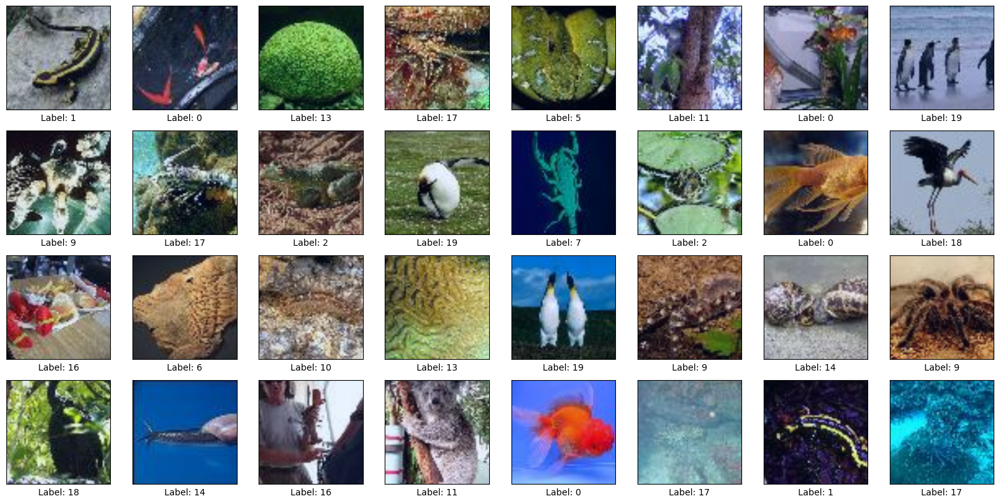

In [6]:
import matplotlib.pyplot as plt
import torchvision
from torchvision.utils import make_grid
import numpy as np

def visualize_samples(loader):
    images, labels = next(iter(loader))
    images = (images - images.min()) / (images.max() - images.min())
    
    grid_size = (4, 8)
    fig, axes = plt.subplots(grid_size[0], grid_size[1], figsize=(16, 8))
    
    images = images[:grid_size[0]*grid_size[1]]
    labels = labels[:grid_size[0]*grid_size[1]]
    
    for i, ax in enumerate(axes.flat):
        img = images[i].permute(1, 2, 0).numpy()
        label = labels[i].item()
        
        ax.imshow(img)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlabel(f"Label: {label}", fontsize=10, color='black')
    
    plt.tight_layout()
    plt.show()

visualize_samples(train_loader)

## Calculate Accuracy

In [7]:
def accuracy(net, loader):
    """Return accuracy on a dataset given by the data loader."""
    correct = 0
    total = 0
    for inputs, targets in loader:
        inputs, targets = inputs.to(DEVICE), targets.to(DEVICE)
        outputs = net(inputs)
        _, predicted = outputs.max(1)
        total += targets.size(0)
        correct += predicted.eq(targets).sum().item()
    return correct / total

print(f"Train set accuracy: {100.0 * accuracy(model, train_loader):0.1f}%")
print(f"Validation set accuracy: {100.0 * accuracy(model, val_loader):0.1f}%")

Train set accuracy: 98.5%
Validation set accuracy: 48.8%


## Explainers

### Create visualization function

#### Visualizuation code for explaining test samples

In [8]:
def visualize_influential_samples(train_dataset, test_tensor, influence_scores, top_k=3):
    top_k_proponents = torch.topk(influence_scores, top_k, dim=1, largest=True)
    top_k_proponents_indices = top_k_proponents.indices
    top_k_proponents_scores = top_k_proponents.values
    
    top_k_opponents = torch.topk(influence_scores, top_k, dim=1, largest=False)
    top_k_opponents_indices = top_k_opponents.indices
    top_k_opponents_scores = top_k_opponents.values
    
    def plot_samples(test_idx):
        proponents_images = [train_dataset[int(idx)][0] for idx in top_k_proponents_indices[test_idx]]
        proponents_images = [(img - img.min()) / (img.max() - img.min()) for img in proponents_images]
        proponents_scores = top_k_proponents_scores[test_idx]
        
        opponents_images = [train_dataset[int(idx)][0] for idx in reversed(top_k_opponents_indices[test_idx])]
        opponents_images = [(img - img.min()) / (img.max() - img.min()) for img in opponents_images]
        opponents_scores = list(reversed(top_k_opponents_scores[test_idx]))
        
        test_image = test_tensor[test_idx]
        test_image = (test_image - test_image.min()) / (test_image.max() - test_image.min())
        
        plt.figure(figsize=(24, 8))

        for i, (img, score) in enumerate(zip(opponents_images, opponents_scores)):
            plt.subplot(1, 7, i + 1)
            plt.imshow(img.permute(1, 2, 0))
            plt.gca().add_patch(plt.Rectangle((0, 0), img.shape[1], img.shape[2], 
                                              linewidth=15, edgecolor='red', facecolor='none'))
            plt.title(f"Opponent {3 - i}\nScore: {score:.4f}")
            plt.axis('off')
        
        plt.subplot(1, 7, 4)
        plt.imshow(test_image.permute(1, 2, 0))
        plt.gca().add_patch(plt.Rectangle((0, 0), img.shape[1], img.shape[2], 
                                          linewidth=15, edgecolor='green', facecolor='none'))
        plt.title(f"Test Sample {test_idx + 1}")
        plt.axis('off')
        
        for i, (img, score) in enumerate(zip(proponents_images, proponents_scores)):
            plt.subplot(1, 7, i + 5)
            plt.imshow(img.permute(1, 2, 0))
            plt.gca().add_patch(plt.Rectangle((0, 0), img.shape[1], img.shape[2], 
                                              linewidth=15, edgecolor='blue', facecolor='none'))
            plt.title(f"Proponent {i + 1}\nScore: {score:.4f}")
            plt.axis('off')
        
        plt.show()
    
    for test_idx in range(len(test_tensor)):
        plot_samples(test_idx)

#### Visualizuation code for self-influence scores

In [9]:
def visualize_self_influence_samples(train_dataset, self_influence_scores, top_k=5):
    top_k_most_influential = torch.topk(self_influence_scores, top_k, largest=True)
    top_k_least_influential = torch.topk(self_influence_scores, top_k, largest=False)
    
    top_k_most_indices = top_k_most_influential.indices
    top_k_most_scores = top_k_most_influential.values
    
    top_k_least_indices = top_k_least_influential.indices
    top_k_least_scores = top_k_least_influential.values
    
    def plot_samples():
        most_influential_images = [train_dataset[int(idx)][0] for idx in top_k_most_indices]
        most_influential_images = [(img - img.min()) / (img.max() - img.min()) for img in most_influential_images]
        
        least_influential_images = [train_dataset[int(idx)][0] for idx in top_k_least_indices]
        least_influential_images = [(img - img.min()) / (img.max() - img.min()) for img in least_influential_images]
        
        plt.figure(figsize=(20, 10))
        
        plt.subplot(2, top_k, 1)
        plt.text(-0.1, 0.5, "Most Influential", fontsize=16, ha='center', va='center', rotation=90, transform=plt.gca().transAxes)
        
        for i, (img, score) in enumerate(zip(most_influential_images, top_k_most_scores)):
            plt.subplot(2, top_k, i + 1)
            plt.imshow(img.permute(1, 2, 0))
            plt.gca().add_patch(plt.Rectangle((0, 0), img.shape[1], img.shape[2], 
                                              linewidth=10, edgecolor='blue', facecolor='none'))
            plt.title(f"Score: {score:.2f}")
            plt.axis('off')
        
        plt.subplot(2, top_k, top_k + 1)
        plt.text(-0.1, 0.5, "Least Influential", fontsize=16, ha='center', va='center', rotation=90, transform=plt.gca().transAxes)
        
        # Plot the least influential samples
        for i, (img, score) in enumerate(zip(least_influential_images, top_k_least_scores)):
            plt.subplot(2, top_k, top_k + i + 1)
            plt.imshow(img.permute(1, 2, 0))
            plt.gca().add_patch(plt.Rectangle((0, 0), img.shape[1], img.shape[2], 
                                              linewidth=10, edgecolor='red', facecolor='none'))
            plt.title(f"Score: {score:.2f}")
            plt.axis('off')
        
        plt.subplots_adjust(wspace=0.4)
        plt.tight_layout()
        plt.show()
    
    plot_samples()

### Similarity Influence

In [10]:
# Initialize Explainer
explainer_similarity = CaptumSimilarity(
    model=model,
    model_id="0",
    cache_dir=str("tmp"),
    train_dataset=train_loader.dataset,
    device=DEVICE,
    layers="avgpool",
    similarity_metric=cosine_similarity,
)

/home/nisc22/xai/quanda/quanda/explainers/wrappers/captum_influence.py:118: UserWarning: CaptumSimilarity explainer only supports CPU devices. Converting model device to 'cpu'.
  warnings.warn("CaptumSimilarity explainer only supports CPU devices. Converting model device to 'cpu'.")


#### Explain test samples

In [11]:
# Define test samples
test_tensor = torch.stack([
    val_loader.dataset[0][0], 
    val_loader.dataset[70][0], 
    val_loader.dataset[120][0], 
    val_loader.dataset[170][0],
    val_loader.dataset[220][0],
])

# Explain test samples
explanations_similarity = explainer_similarity.explain(test_tensor)

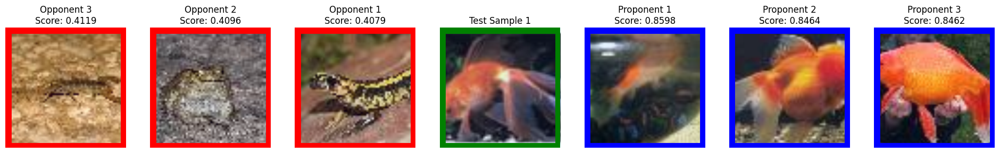

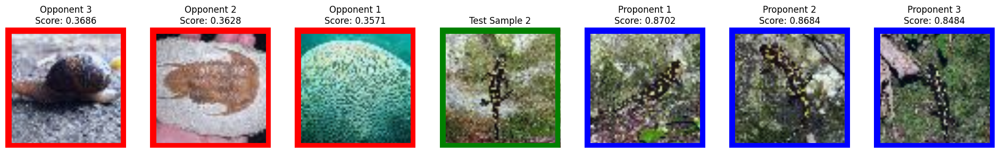

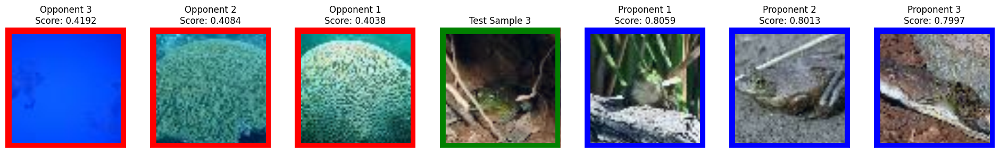

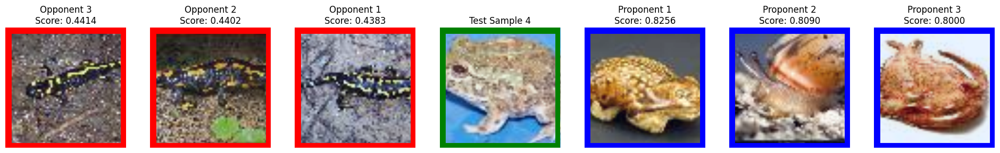

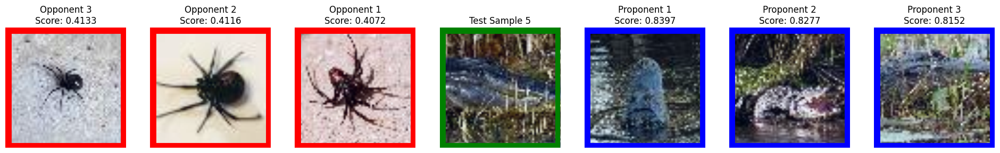

In [12]:
# Visualize explanations
visualize_influential_samples(train_loader.dataset, test_tensor, explanations_similarity, top_k=3)

### TracInCPFastRandProj

In [13]:
# Initialize Explainer
explainer_tracincpfast = CaptumTracInCPFastRandProj(
        model=model.to("cpu"),
        model_id="0",
        cache_dir=str("tmp"),
        train_dataset=train_loader.dataset,
        checkpoints=checkpoints,
        loss_fn=torch.nn.CrossEntropyLoss(reduction="sum"),
        final_fc_layer=list(model.children())[-1],
        device="cpu",
        batch_size=64,
        nearest_neighbors=AnnoyNearestNeighbors(num_trees=100),
        projection_dim=100,
    )

/home/nisc22/.conda/envs/new_env/lib/python3.8/site-packages/captum/influence/_core/tracincp_fast_rand_proj.py:1035: UserWarning: WARNING: Using this implementation stores quantities related to the entire `train_dataset` in memory, and may results in running out of memory. If this happens, consider using `TracInCPFast` instead, for which each call to `influence` to compute influence scores or proponents will be slower, but may avoid running out of memory.
  warnings.warn(


#### Explain test samples

In [14]:
# Define test samples
test_tensor = torch.stack([
    val_loader.dataset[0][0], 
    val_loader.dataset[70][0], 
    val_loader.dataset[120][0], 
    val_loader.dataset[170][0],
    val_loader.dataset[220][0],
])

test_targets = torch.tensor([
    val_loader.dataset[0][1], 
    val_loader.dataset[70][1], 
    val_loader.dataset[120][1], 
    val_loader.dataset[170][1],
    val_loader.dataset[220][1],
])

# Explain test samples
explanations_tracincpfast = explainer_tracincpfast.explain(test_tensor, targets=test_targets)

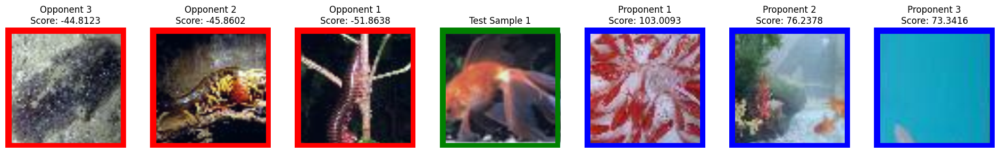

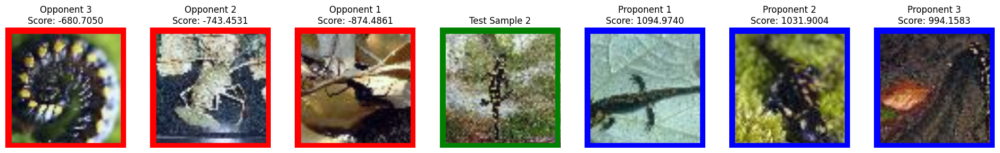

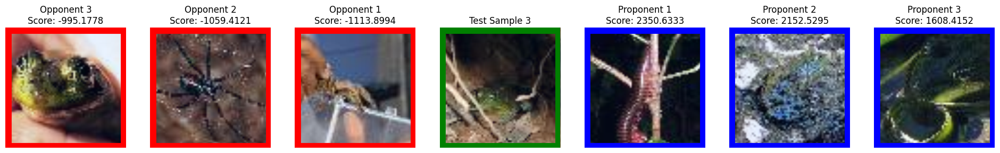

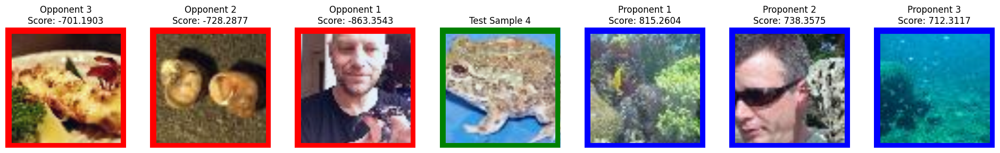

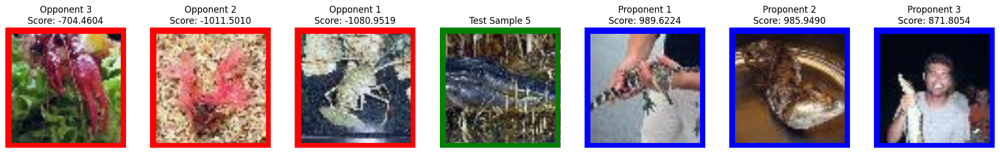

In [15]:
# Visualize explanations
visualize_influential_samples(train_loader.dataset, test_tensor, explanations_tracincpfast, top_k=3)

#### Self-Influence

In [16]:
self_influence_tracincpfast = explainer_tracincpfast.self_influence()

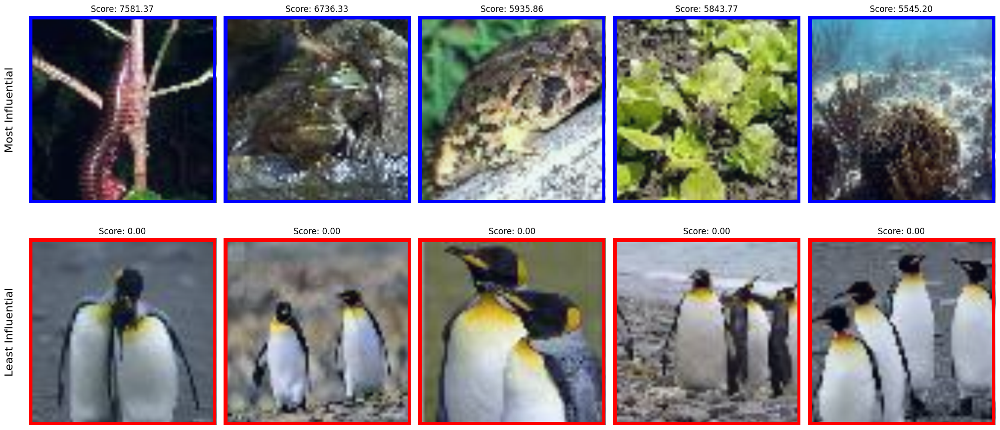

In [17]:
visualize_self_influence_samples(train_loader.dataset, self_influence_tracincpfast, top_k=5)

### Arnoldi Influence Function

In [ ]:
# Create the hessian dataset (i.e. a subset of the training set used for computing the hessian)
train_dataset = train_loader.dataset
num_samples = 1000
indices = random.sample(range(len(train_dataset)), num_samples)
hessian_dataset = Subset(train_dataset, indices)

In [ ]:
# Initialize Explainer
explainer_arnoldi = CaptumArnoldi(
    model=model.to("cpu"),
    train_dataset=train_loader.dataset,
    hessian_dataset=hessian_dataset,
    checkpoint=checkpoints[0],
    device="cpu",
    loss_fn=torch.nn.CrossEntropyLoss(reduction="none"),
    projection_dim=10,
    arnoldi_dim=200,
)

#### Explain test samples

In [ ]:
# Define test samples
test_tensor = torch.stack([
    val_loader.dataset[0][0], 
    val_loader.dataset[70][0], 
    val_loader.dataset[120][0], 
    val_loader.dataset[170][0],
    val_loader.dataset[220][0],
])

test_targets = torch.tensor([
    val_loader.dataset[0][1], 
    val_loader.dataset[70][1], 
    val_loader.dataset[120][1], 
    val_loader.dataset[170][1],
    val_loader.dataset[220][1],
])

# Explain test samples
explanations_arnoldi = explainer_arnoldi.explain(test=test_tensor, targets=test_targets)

In [ ]:
# Visualize explanations
visualize_influential_samples(train_loader.dataset, test_tensor, explanations_arnoldi, top_k=3)

### TracInCP

In [ ]:
# Initialize Explainer
explainer_tracincp = CaptumTracInCP(
        model=model.to("cpu"),
        train_dataset=train_loader.dataset,
        checkpoints=checkpoints,
        loss_fn=torch.nn.CrossEntropyLoss(reduction="none"),
        device="cpu",
        batch_size=64,
    )

#### Explain test samples

In [ ]:
# Define test samples
test_tensor = torch.stack([
    val_loader.dataset[0][0], 
    val_loader.dataset[70][0], 
    val_loader.dataset[120][0], 
    val_loader.dataset[170][0],
    val_loader.dataset[220][0],
])

test_targets = torch.tensor([
    val_loader.dataset[0][1], 
    val_loader.dataset[70][1], 
    val_loader.dataset[120][1], 
    val_loader.dataset[170][1],
    val_loader.dataset[220][1],
])

# Explain test samples
explanations_tracincp = explainer_tracincp.explain(test_tensor, targets=test_targets)

In [ ]:
# Visualize explanations
visualize_influential_samples(train_loader.dataset, test_tensor, explanations_tracincp, top_k=3)